In [8]:
import pandas as pd
import numpy as np

df=pd.read_csv('E:\high radius\H2HBABBA1507.csv')
df.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
0,U001,0100052815,KETTL corporation,2019-12-11 00:00:00,2019.0,1.930200e+09,2019-11-27,20191127,20191127,20191207.0,USD,RV,1.0,NaN,94085.55,20191127.0,NA10,1.930200e+09,0
1,U001,0200769623,WAL-MAR us,2020-02-04 00:00:00,2020.0,1.930421e+09,2020-01-23,20200121,20200123,20200207.0,USD,RV,1.0,NaN,27636.17,20200123.0,NAH4,1.930421e+09,0
2,U001,0200943275,US corp,2019-11-15 00:00:00,2019.0,1.930067e+09,2019-10-30,20191029,20191030,20191114.0,USD,RV,1.0,NaN,1713.40,20191030.0,NAA8,1.930067e+09,0
3,U001,0200769623,WAL-MAR foundation,NaN,2020.0,1.930623e+09,2020-03-10,20200308,20200310,20200325.0,USD,RV,1.0,NaN,14744.71,20200310.0,NAH4,1.930623e+09,1
4,U001,0200793513,KROGER foundation,NaN,2020.0,1.930692e+09,2020-03-24,20200324,20200324,20200408.0,USD,RV,1.0,NaN,40740.24,20200324.0,NAA8,1.930692e+09,1


In [9]:
df.columns
df.shape

(50000, 19)

In [10]:
df.isna().sum().sort_values(ascending=False)


area_business             50000
clear_date                10000
invoice_id                   10
isOpen                        0
document_create_date          0
cust_number                   0
name_customer                 0
buisness_year                 0
doc_id                        0
posting_date                  0
due_in_date                   0
document_create_date.1        0
invoice_currency              0
document type                 0
posting_id                    0
total_open_amount             0
baseline_create_date          0
cust_payment_terms            0
business_code                 0
dtype: int64

In [11]:
df.columns.unique()

Index(['business_code', 'cust_number', 'name_customer', 'clear_date',
       'buisness_year', 'doc_id', 'posting_date', 'document_create_date',
       'document_create_date.1', 'due_in_date', 'invoice_currency',
       'document type', 'posting_id', 'area_business', 'total_open_amount',
       'baseline_create_date', 'cust_payment_terms', 'invoice_id', 'isOpen'],
      dtype='object')

In [17]:
dg=df.copy()

#### Dropping unwanted columns

In [13]:
dd=df.drop(['name_customer','doc_id','document_create_date','area_business','invoice_id','baseline_create_date'],axis='columns',inplace=False)
dd.head()

,business_code,cust_number,clear_date,buisness_year,posting_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,cust_payment_terms,isOpen
0,U001,0100052815,2019-12-11 00:00:00,2019.0,2019-11-27,20191127,20191207.0,USD,RV,1.0,94085.55,NA10,0
1,U001,0200769623,2020-02-04 00:00:00,2020.0,2020-01-23,20200123,20200207.0,USD,RV,1.0,27636.17,NAH4,0
2,U001,0200943275,2019-11-15 00:00:00,2019.0,2019-10-30,20191030,20191114.0,USD,RV,1.0,1713.40,NAA8,0
3,U001,0200769623,NaN,2020.0,2020-03-10,20200310,20200325.0,USD,RV,1.0,14744.71,NAH4,1
4,U001,0200793513,NaN,2020.0,2020-03-24,20200324,20200408.0,USD,RV,1.0,40740.24,NAA8,1


#### Checking for NA values and the shape of our dataset

In [14]:
dd.isna().sum().sort_values(ascending=False)


clear_date                10000
isOpen                        0
cust_payment_terms            0
total_open_amount             0
posting_id                    0
document type                 0
invoice_currency              0
due_in_date                   0
document_create_date.1        0
posting_date                  0
buisness_year                 0
cust_number                   0
business_code                 0
dtype: int64

In [15]:
dd.shape

(50000, 13)

#### Slicing our validation dataset from our dataset using the isOpen as the criteria

In [95]:
test=dg.loc[dd['isOpen']==1]
test

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
3,U001,0200769623,WAL-MAR foundation,NaN,2020.0,1.930623e+09,2020-03-10,20200308,20200310,20200325.0,USD,RV,1.0,NaN,14744.71,20200310.0,NAH4,1.930623e+09,1
4,U001,0200793513,KROGER foundation,NaN,2020.0,1.930692e+09,2020-03-24,20200324,20200324,20200408.0,USD,RV,1.0,NaN,40740.24,20200324.0,NAA8,1.930692e+09,1
7,U001,0200769623,WAL-MAR in,NaN,2020.0,1.930718e+09,2020-03-29,20200329,20200329,20200413.0,USD,RV,1.0,NaN,37514.42,20200329.0,NAH4,1.930718e+09,1
8,U001,0200769623,WAL-MAR foundation,NaN,2020.0,1.930852e+09,2020-05-03,20200502,20200503,20200518.0,USD,RV,1.0,NaN,16972.73,20200503.0,NAH4,1.930852e+09,1
14,U001,0200769623,WAL-MAR,NaN,2020.0,1.930823e+09,2020-04-25,20200424,20200425,20200510.0,USD,RV,1.0,NaN,1329.23,20200425.0,NAH4,1.930823e+09,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49986,U001,0200769623,WAL-MAR systems,NaN,2020.0,1.930751e+09,2020-04-05,20200404,20200405,20200420.0,USD,RV,1.0,NaN,285.61,20200405.0,NAH4,1.930751e+09,1
49987,U001,0200769623,WAL-MAR associates,NaN,2020.0,1.930829e+09,2020-04-27,20200427,20200427,20200512.0,USD,RV,1.0,NaN,41933.26,20200427.0,NAH4,1.930829e+09,1
49992,U001,0200772595,SAFEW,NaN,2020.0,1.930685e+09,2020-03-23,20200321,20200323,20200407.0,USD,RV,1.0,NaN,95727.56,20200323.0,NAA8,1.930685e+09,1
49993,U001,0200769623,WAL-MAR corporation,NaN,2020.0,1.930715e+09,2020-03-29,20200328,20200329,20200413.0,USD,RV,1.0,NaN,8797.50,20200329.0,NAH4,1.930715e+09,1


In [19]:
test.isna().sum().sort_values(ascending=False)

clear_date                10000
area_business             10000
isOpen                        0
document_create_date.1        0
cust_number                   0
name_customer                 0
buisness_year                 0
doc_id                        0
posting_date                  0
document_create_date          0
due_in_date                   0
invoice_id                    0
invoice_currency              0
document type                 0
posting_id                    0
total_open_amount             0
baseline_create_date          0
cust_payment_terms            0
business_code                 0
dtype: int64

In [20]:
test.drop(['area_business','clear_date'],axis='columns',inplace=True)
test.head()

C:\Users\Xeno\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,business_code,cust_number,name_customer,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
3,U001,0200769623,WAL-MAR foundation,2020.0,1.930623e+09,2020-03-10,20200308,20200310,20200325.0,USD,RV,1.0,14744.71,20200310.0,NAH4,1.930623e+09,1
4,U001,0200793513,KROGER foundation,2020.0,1.930692e+09,2020-03-24,20200324,20200324,20200408.0,USD,RV,1.0,40740.24,20200324.0,NAA8,1.930692e+09,1
7,U001,0200769623,WAL-MAR in,2020.0,1.930718e+09,2020-03-29,20200329,20200329,20200413.0,USD,RV,1.0,37514.42,20200329.0,NAH4,1.930718e+09,1
8,U001,0200769623,WAL-MAR foundation,2020.0,1.930852e+09,2020-05-03,20200502,20200503,20200518.0,USD,RV,1.0,16972.73,20200503.0,NAH4,1.930852e+09,1
14,U001,0200769623,WAL-MAR,2020.0,1.930823e+09,2020-04-25,20200424,20200425,20200510.0,USD,RV,1.0,1329.23,20200425.0,NAH4,1.930823e+09,1


In [21]:
train=dd.loc[dd['isOpen']==0]
train
pd.set_option('mode.chained_assignment', None)

#### Again Checking for na values for our train dataset

In [22]:
train.isna().sum().sort_values(ascending=False)

isOpen                    0
cust_payment_terms        0
total_open_amount         0
posting_id                0
document type             0
invoice_currency          0
due_in_date               0
document_create_date.1    0
posting_date              0
buisness_year             0
clear_date                0
cust_number               0
business_code             0
dtype: int64

No NA values found

In [23]:
train['posting_date']

0        2019-11-27
1        2020-01-23
2        2019-10-30
5        2019-10-10
6        2019-10-07
            ...    
49994    2019-07-20
49995    2019-05-12
49996    2019-08-02
49997    2019-08-01
49999    2019-02-20
Name: posting_date, Length: 40000, dtype: object

In [24]:
train['posting_date']=pd.to_datetime(train['posting_date'])

#### Reset the index and set the index to posting date

In [25]:
train.set_index('posting_date',inplace=True)
train

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,cust_payment_terms,isOpen
posting_date,,,,,,,,,,,,
2019-11-27,U001,0100052815,2019-12-11 00:00:00,2019.0,20191127,20191207.0,USD,RV,1.0,94085.55,NA10,0
2020-01-23,U001,0200769623,2020-02-04 00:00:00,2020.0,20200123,20200207.0,USD,RV,1.0,27636.17,NAH4,0
2019-10-30,U001,0200943275,2019-11-15 00:00:00,2019.0,20191030,20191114.0,USD,RV,1.0,1713.40,NAA8,0
2019-10-10,U001,0200769623,2019-10-22 00:00:00,2019.0,20191010,20191025.0,USD,RV,1.0,39874.00,NAH4,0
2019-10-07,U001,0140142846,2019-12-10 00:00:00,2019.0,20191007,20191206.0,USD,RV,1.0,1429.70,NACB,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-20,U001,0200769623,2019-07-30 00:00:00,2019.0,20190720,20190804.0,USD,RV,1.0,26217.48,NAH4,0
2019-05-12,U001,0200704045,2019-05-28 00:00:00,2019.0,20190512,20190527.0,USD,RV,1.0,67311.50,NAA8,0
2019-08-02,U001,0200741174,2019-08-20 00:00:00,2019.0,20190802,20190817.0,USD,RV,1.0,23218.19,NAA8,0


#### Sorting the posting date index

In [26]:
train.sort_index(inplace=True)
train

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,cust_payment_terms,isOpen
posting_date,,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10 00:00:00,2019.0,20181230,20190114.0,USD,RV,1.0,44540.57,NAH4,0
2018-12-30,U001,0200739006,2019-01-18 00:00:00,2019.0,20181230,20190114.0,USD,RV,1.0,10018.72,NAA8,0
2018-12-30,U001,0200769623,2019-01-09 00:00:00,2019.0,20181230,20190114.0,USD,RV,1.0,17436.53,NAH4,0
2018-12-30,U001,0200726979,2019-01-15 00:00:00,2019.0,20181230,20190114.0,USD,RV,1.0,58.18,NAA8,0
2018-12-30,U001,0200762301,2019-01-15 00:00:00,2019.0,20181230,20190114.0,USD,RV,1.0,13866.83,NAC6,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-26,U001,0200726979,2020-05-01 00:00:00,2020.0,20200226,20200501.0,USD,RV,1.0,14382.86,NAGD,0
2020-02-26,U001,0200769623,2020-03-13 00:00:00,2020.0,20200226,20200312.0,USD,RV,1.0,64442.67,NAH4,0
2020-02-27,U001,0200794332,2020-03-12 00:00:00,2020.0,20200227,20200313.0,USD,RV,1.0,5218.12,NAAX,0


#### Removing  duplicate and constant columns

In [27]:
train['posting_id'].std()

train.drop('posting_id',axis='columns',inplace=True)

we can remove this column as the standard deviation is zero

In [28]:
train.head(10)

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen
posting_date,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10 00:00:00,2019.0,20181230,20190114.0,USD,RV,44540.57,NAH4,0
2018-12-30,U001,0200739006,2019-01-18 00:00:00,2019.0,20181230,20190114.0,USD,RV,10018.72,NAA8,0
2018-12-30,U001,0200769623,2019-01-09 00:00:00,2019.0,20181230,20190114.0,USD,RV,17436.53,NAH4,0
2018-12-30,U001,0200726979,2019-01-15 00:00:00,2019.0,20181230,20190114.0,USD,RV,58.18,NAA8,0
2018-12-30,U001,0200762301,2019-01-15 00:00:00,2019.0,20181230,20190114.0,USD,RV,13866.83,NAC6,0
2018-12-30,U001,0200769623,2019-01-11 00:00:00,2019.0,20181230,20190114.0,USD,RV,49677.54,NAH4,0
2018-12-30,U001,0200759878,2019-01-15 00:00:00,2019.0,20181230,20190114.0,USD,RV,14149.92,NAH4,0
2018-12-30,U001,0200769623,2019-01-10 00:00:00,2019.0,20181230,20190114.0,USD,RV,504.19,NAH4,0
2018-12-30,U001,0200769623,2019-01-11 00:00:00,2019.0,20181230,20190114.0,USD,RV,48095.20,NAH4,0


#### converting date columns into datetime format

In [29]:
train['due_in_date'] = pd.to_datetime(train['due_in_date'], format='%Y%m%d')
train['document_create_date.1'] = pd.to_datetime(train['document_create_date.1'], format='%Y%m%d')
train['clear_date'] = pd.to_datetime(train['clear_date'])

train

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen
posting_date,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10,2019.0,2018-12-30,2019-01-14,USD,RV,44540.57,NAH4,0
2018-12-30,U001,0200739006,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,RV,10018.72,NAA8,0
2018-12-30,U001,0200769623,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,RV,17436.53,NAH4,0
2018-12-30,U001,0200726979,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,58.18,NAA8,0
2018-12-30,U001,0200762301,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,13866.83,NAC6,0
...,...,...,...,...,...,...,...,...,...,...,...
2020-02-26,U001,0200726979,2020-05-01,2020.0,2020-02-26,2020-05-01,USD,RV,14382.86,NAGD,0
2020-02-26,U001,0200769623,2020-03-13,2020.0,2020-02-26,2020-03-12,USD,RV,64442.67,NAH4,0
2020-02-27,U001,0200794332,2020-03-12,2020.0,2020-02-27,2020-03-13,USD,RV,5218.12,NAAX,0


### Label encoding the category columns

In [30]:
# 'business_code' ,'cust_number' , 'cust_payment_terms','invoice_currency','document type'
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
train['business_code_enc'] = label_encoder.fit_transform(train['business_code'])
train['cust_number_enc'] = label_encoder.fit_transform(train['cust_number'])
train['cust_payment_terms_enc'] = label_encoder.fit_transform(train['cust_payment_terms'])
train['invoice_currency_enc'] = label_encoder.fit_transform(train['invoice_currency'])
train['document type_enc'] = label_encoder.fit_transform(train['document type'])
train.head()

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc
posting_date,,,,,,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10,2019.0,2018-12-30,2019-01-14,USD,RV,44540.57,NAH4,0,1,845,32,1,0
2018-12-30,U001,0200739006,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,RV,10018.72,NAA8,0,1,775,18,1,0
2018-12-30,U001,0200769623,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,RV,17436.53,NAH4,0,1,845,32,1,0
2018-12-30,U001,0200726979,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,58.18,NAA8,0,1,747,18,1,0
2018-12-30,U001,0200762301,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,13866.83,NAC6,0,1,830,23,1,0


### FEATURE GENERATION/finding delay in terms of date

In [31]:

train['delay'] = pd.Series(train['clear_date'] - train['due_in_date']).dt.days
train['due_duration']=pd.Series(train['due_in_date'] - train['document_create_date.1']).dt.days
train.head()

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc,delay,due_duration
posting_date,,,,,,,,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10,2019.0,2018-12-30,2019-01-14,USD,RV,44540.57,NAH4,0,1,845,32,1,0,-4,15
2018-12-30,U001,0200739006,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,RV,10018.72,NAA8,0,1,775,18,1,0,4,15
2018-12-30,U001,0200769623,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,RV,17436.53,NAH4,0,1,845,32,1,0,-5,15
2018-12-30,U001,0200726979,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,58.18,NAA8,0,1,747,18,1,0,1,15
2018-12-30,U001,0200762301,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,13866.83,NAC6,0,1,830,23,1,0,1,15


### Data visualisation of the features

In [32]:
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
for col in list(set(train.columns) - set(['business_code','cust_number','clear_date','document_create_date.1','due_in_date','invoice_currency','document type','cust_payment_terms','isOpen'])):
    fig = px.histogram(train, x=col)
    fig.show()

We can see from the histogram plots 
we can see total_open_amount is highly right skewed

In [33]:
columns=['delay','due_duration']
for col in columns:
    fig = px.box(train, y=col)
    fig.show()

Identifying the outliers from the above box plot for the three columns 'due_duration','payment_duration','delay'





-60 < delay <100
-50< due duration <100


In [34]:
train.shape

(40000, 18)

In [35]:
train= train[((train['due_duration']>-50) & (train['due_duration']< 100 ))&((train['delay']>-60) & (train['delay']< 100 ))].reset_index()
train.shape

(39912, 19)

After removing the outliers 

In [36]:
train.set_index('posting_date',inplace=True)
train.sort_index(inplace=True)
train.head()

,business_code,cust_number,clear_date,buisness_year,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc,delay,due_duration
posting_date,,,,,,,,,,,,,,,,,,
2018-12-30,U001,0200769623,2019-01-10,2019.0,2018-12-30,2019-01-14,USD,RV,44540.57,NAH4,0,1,845,32,1,0,-4,15
2018-12-30,U001,0200739006,2019-01-18,2019.0,2018-12-30,2019-01-14,USD,RV,10018.72,NAA8,0,1,775,18,1,0,4,15
2018-12-30,U001,0200769623,2019-01-09,2019.0,2018-12-30,2019-01-14,USD,RV,17436.53,NAH4,0,1,845,32,1,0,-5,15
2018-12-30,U001,0200726979,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,58.18,NAA8,0,1,747,18,1,0,1,15
2018-12-30,U001,0200762301,2019-01-15,2019.0,2018-12-30,2019-01-14,USD,RV,13866.83,NAC6,0,1,830,23,1,0,1,15


####  log tranformation of total open amount

In [37]:
train['total_open_amount'] = np.log(train['total_open_amount'])

grouping using document create date

In [38]:
train_n = train[['total_open_amount','delay','due_duration']].groupby(train['document_create_date.1']).sum()
train_n

,total_open_amount,delay,due_duration
document_create_date.1,,,
2018-12-30,421.284882,-32,744
2018-12-31,615.452131,-3,988
2019-01-01,351.621069,85,545
2019-01-02,656.103524,174,1146
2019-01-03,812.626414,150,1522
...,...,...,...
2020-02-23,537.383686,61,1023
2020-02-24,952.732992,-309,1951
2020-02-25,1247.807938,-87,2400


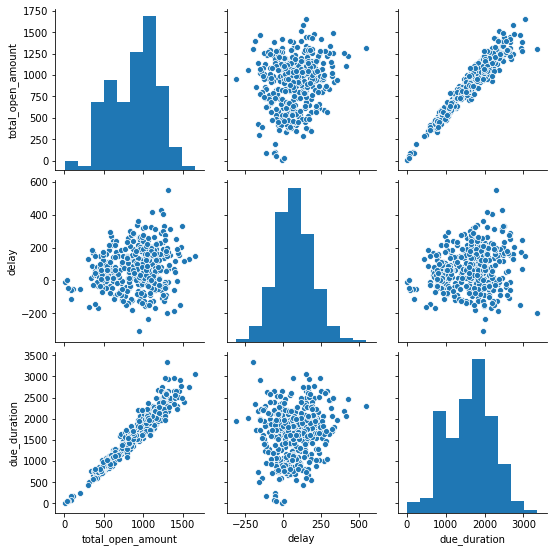

In [39]:
sns.pairplot(train_n)

In [40]:
train.columns


Index(['business_code', 'cust_number', 'clear_date', 'buisness_year',
       'document_create_date.1', 'due_in_date', 'invoice_currency',
       'document type', 'total_open_amount', 'cust_payment_terms', 'isOpen',
       'business_code_enc', 'cust_number_enc', 'cust_payment_terms_enc',
       'invoice_currency_enc', 'document type_enc', 'delay', 'due_duration'],
      dtype='object')

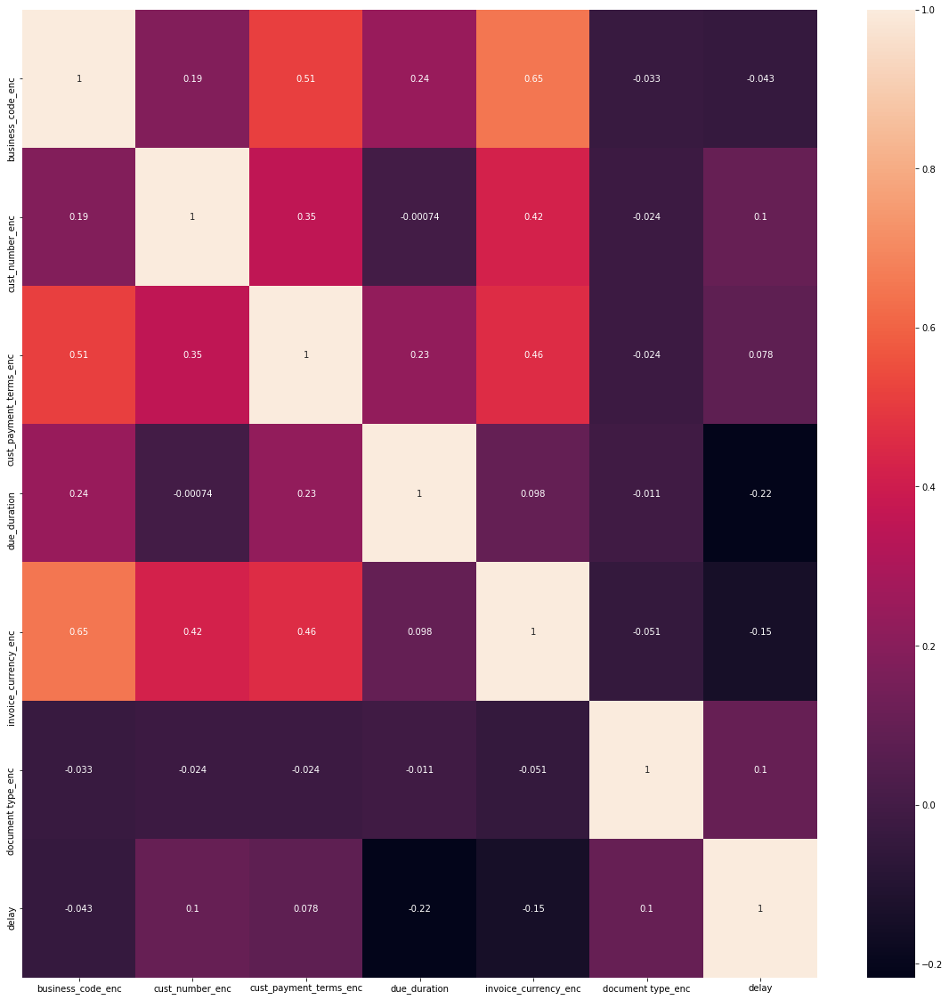

In [41]:
cols = ['business_code_enc', 'cust_number_enc', 'cust_payment_terms_enc','due_duration',
       'invoice_currency_enc', 'document type_enc', 'delay']

corr = train[cols].corr()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corr, annot=True)
plt.show()

#### we can see delay is positively correlated to 'cust_number_enc','cus_payment_emc'
#### we can see delay is negetively correlated to 'due duration','invoice_currency_enc'
              
#### we can see  bussiness_code_enc is highly correlated with invoice_currency_enc 0.65


In [42]:
from sklearn.model_selection import train_test_split
x_cols=['business_code_enc', 'cust_number_enc', 'cust_payment_terms_enc',
       'invoice_currency_enc', 'document type_enc','due_duration']
y_cols=['delay']

#### TRAIN TEST  VALIDATION  SPLIT

In [43]:
X_train,X_inter_test,y_train,y_inter_test = train_test_split(train[x_cols],train[y_cols],test_size=0.3,random_state=0 , shuffle = False)

In [44]:
X_val,X_test,y_val,y_test = train_test_split(X_inter_test,y_inter_test,test_size=0.5,random_state=0 , shuffle = False)

####  Linear Regression

In [45]:
from sklearn.linear_model import LinearRegression
base_model = LinearRegression()
base_model.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [46]:
y_predict = base_model.predict(X_val)

In [47]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print(mean_squared_error(y_val, y_predict))
print(mean_absolute_error(y_val, y_predict))
print(np.sqrt(mean_squared_error(y_val, y_predict)))

42.45321102560696
4.289207232276041
6.515612866462138


In [48]:

y_predict_test = base_model.predict(X_test)

print(mean_squared_error(y_test, y_predict_test))
print(mean_absolute_error(y_test, y_predict_test))
print(np.sqrt(mean_squared_error(y_test, y_predict_test)))

74.40938434104034
4.994862812540041
8.626087429480432


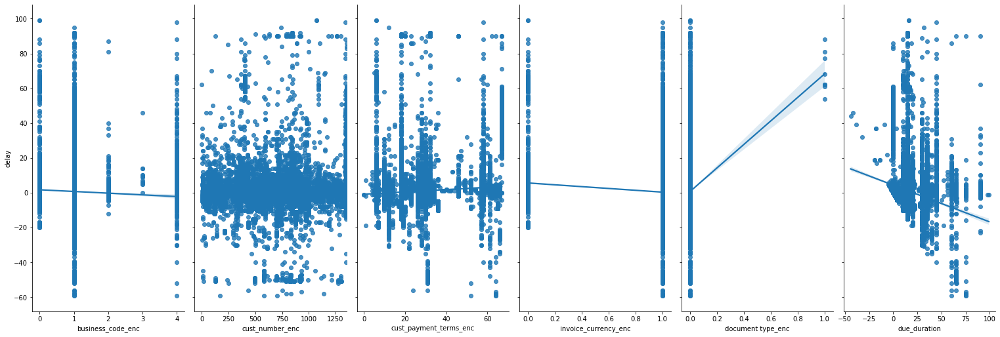

In [49]:
sns.pairplot(train, x_vars=['business_code_enc', 'cust_number_enc', 'cust_payment_terms_enc',
       'invoice_currency_enc', 'document type_enc','due_duration'], y_vars='delay', height=7, aspect=0.5, kind='reg')

#### Lasso Regression

In [50]:
from sklearn import linear_model
lm = linear_model.Lasso(alpha=0.1)
lm.fit(X_train, y_train)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [51]:
y_predict4 = lm.predict(X_val)
print(mean_squared_error(y_val, y_predict4))
print(mean_absolute_error(y_val, y_predict4))
print(np.sqrt(mean_squared_error(y_val, y_predict4)))

41.97779955642536
4.225510208685135
6.479027670601922


In [52]:
y_predict_test4= lm.predict(X_test)
print(mean_squared_error(y_test, y_predict_test4))
print(mean_absolute_error(y_test, y_predict_test4))
print(np.sqrt(mean_squared_error(y_test, y_predict_test4)))

75.40626765121469
4.95781508664066
8.683678232823617


### Tree model

#### Decisiontree regressor

In [53]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state=0 , max_depth=10)

regressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=10,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [54]:
y_predict2 = regressor.predict(X_val)
print(mean_squared_error(y_val, y_predict2))
print(mean_absolute_error(y_val, y_predict2))
print(np.sqrt(mean_squared_error(y_val, y_predict2)))

25.79922370987547
2.7575499642364
5.079293623120785


In [55]:
y_predict_test2 = regressor.predict(X_test)
print(mean_squared_error(y_test, y_predict_test2))
print(mean_absolute_error(y_test, y_predict_test2))
print(np.sqrt(mean_squared_error(y_test, y_predict_test2)))

40.94380797853096
2.9557478668970765
6.398734873280105


#### Randomtree regressor

In [56]:
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(max_depth=10, random_state=0)
regr.fit(X_train, y_train.values.ravel())

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=10, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [57]:
y_predict3 = regr.predict(X_val)
print(mean_squared_error(y_val, y_predict3))
print(mean_absolute_error(y_val, y_predict3))
print(np.sqrt(mean_squared_error(y_val, y_predict3)))

24.621653624747267
2.713903506810455
4.96202112296464


In [58]:
y_predict_test3 = regr.predict(X_test)
print(mean_squared_error(y_test, y_predict_test3))
print(mean_absolute_error(y_test, y_predict_test3))
print(np.sqrt(mean_squared_error(y_test, y_predict_test3)))

39.62673358713473
2.9465875281970337
6.294976853582127


#### SVM regressor

In [59]:
from sklearn import svm
svmr = svm.SVR()
svmr.fit(X_train, y_train.values.ravel())


SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [60]:
y_predict5 = svmr.predict(X_val)
print(mean_squared_error(y_val, y_predict5))
print(mean_absolute_error(y_val, y_predict5))
print(np.sqrt(mean_squared_error(y_val, y_predict5)))

43.15744282344661
3.5101013222186928
6.569432458245279


In [63]:
y_predict_test5 = svmr.predict(X_test)
print(mean_squared_error(y_test, y_predict_test5))
print(mean_absolute_error(y_test, y_predict_test5))
print(np.sqrt(mean_squared_error(y_test, y_predict_test5)))

84.95093554795677
4.134885032301165
9.21688317968481


### So optimum model to use is random tree regressor
     On validation set
     root mean square error = 4.96202112296464
     mean absolute error =2.713903506810455
     
     On test set
     root mean square error = 2.9465875281970337
     mean absolute error =2.713903506810455
     

## we have to bring the test dataset  in same format as that of the X_train

doing the same preprocessing done on X_train

In [96]:
test['posting_date']=pd.to_datetime(test['posting_date'])
test.set_index('posting_date',inplace=True)
test.sort_index(inplace=True)
test.drop('posting_id',axis='columns',inplace=True)
test['due_in_date'] = pd.to_datetime(test['due_in_date'], format='%Y%m%d')
test['document_create_date.1'] = pd.to_datetime(test['document_create_date.1'], format='%Y%m%d')
test['due_duration']=pd.Series(test['due_in_date'] - test['document_create_date.1']).dt.days

test.drop('isOpen',axis='columns',inplace=True)


test.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_duration
posting_date,,,,,,,,,,,,,,,,,
2020-02-27,U001,0200974851,RESTA trust,NaN,2020.0,1.930580e+09,20200227,2020-02-27,2020-03-18,USD,RV,NaN,7359.53,20200227.0,NAD1,1.930580e+09,20
2020-02-27,U001,0200769623,WAL-MAR,NaN,2020.0,1.930568e+09,20200225,2020-02-27,2020-05-02,USD,RV,NaN,599.15,20200227.0,NAGD,1.930568e+09,65
2020-02-27,U001,0200707822,PUBLI associates,NaN,2020.0,1.930577e+09,20200227,2020-02-27,2020-03-13,USD,RV,NaN,32707.14,20200227.0,NAA8,1.930577e+09,15
2020-02-27,U001,0200847305,CUSTOM,NaN,2020.0,1.930571e+09,20200226,2020-02-27,2020-03-08,USD,RV,NaN,71826.75,20200227.0,NA10,1.930571e+09,10
2020-02-27,U001,0200974851,RESTA,NaN,2020.0,1.930578e+09,20200227,2020-02-27,2020-03-18,USD,RV,NaN,1186.94,20200227.0,NAD1,1.930578e+09,20


In [97]:
from sklearn.preprocessing import LabelEncoder
test['total_open_amount'] = np.log(test['total_open_amount'])
label_encoder = LabelEncoder()
test['business_code_enc'] = label_encoder.fit_transform(test['business_code'])
test['cust_number_enc'] = label_encoder.fit_transform(test['cust_number'])
test['cust_payment_terms_enc'] = label_encoder.fit_transform(test['cust_payment_terms'])
test['invoice_currency_enc'] = label_encoder.fit_transform(test['invoice_currency'])
test['document type_enc'] = label_encoder.fit_transform(test['document type'])
test.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,document_create_date,document_create_date.1,due_in_date,invoice_currency,...,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_duration,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc
posting_date,,,,,,,,,,,,,,,,,,,,,
2020-02-27,U001,0200974851,RESTA trust,NaN,2020.0,1.930580e+09,20200227,2020-02-27,2020-03-18,USD,...,8.903751,20200227.0,NAD1,1.930580e+09,20,1,493,22,1,0
2020-02-27,U001,0200769623,WAL-MAR,NaN,2020.0,1.930568e+09,20200225,2020-02-27,2020-05-02,USD,...,6.395512,20200227.0,NAGD,1.930568e+09,65,1,393,25,1,0
2020-02-27,U001,0200707822,PUBLI associates,NaN,2020.0,1.930577e+09,20200227,2020-02-27,2020-03-13,USD,...,10.395349,20200227.0,NAA8,1.930577e+09,15,1,303,12,1,0
2020-02-27,U001,0200847305,CUSTOM,NaN,2020.0,1.930571e+09,20200226,2020-02-27,2020-03-08,USD,...,11.182012,20200227.0,NA10,1.930571e+09,10,1,465,5,1,0
2020-02-27,U001,0200974851,RESTA,NaN,2020.0,1.930578e+09,20200227,2020-02-27,2020-03-18,USD,...,7.079134,20200227.0,NAD1,1.930578e+09,20,1,493,22,1,0


### Using our random forest model to predict the delay

In [98]:
x_cols=['business_code_enc', 'cust_number_enc', 'cust_payment_terms_enc',
       'invoice_currency_enc', 'document type_enc','due_duration']
final_result = regr.predict(test[x_cols])
final_result = pd.Series(final_result,name='delay')




In [99]:
test.reset_index(drop=True,inplace=True)

Final = test.merge(final_result , on = test.index )
Final

,key_0,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,document_create_date,document_create_date.1,due_in_date,...,baseline_create_date,cust_payment_terms,invoice_id,due_duration,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc,delay
0,0,U001,0200974851,RESTA trust,NaN,2020.0,1.930580e+09,20200227,2020-02-27,2020-03-18,...,20200227.0,NAD1,1.930580e+09,20,1,493,22,1,0,0.540244
1,1,U001,0200769623,WAL-MAR,NaN,2020.0,1.930568e+09,20200225,2020-02-27,2020-05-02,...,20200227.0,NAGD,1.930568e+09,65,1,393,25,1,0,2.544014
2,2,U001,0200707822,PUBLI associates,NaN,2020.0,1.930577e+09,20200227,2020-02-27,2020-03-13,...,20200227.0,NAA8,1.930577e+09,15,1,303,12,1,0,2.530819
3,3,U001,0200847305,CUSTOM,NaN,2020.0,1.930571e+09,20200226,2020-02-27,2020-03-08,...,20200227.0,NA10,1.930571e+09,10,1,465,5,1,0,11.965724
4,4,U001,0200974851,RESTA,NaN,2020.0,1.930578e+09,20200227,2020-02-27,2020-03-18,...,20200227.0,NAD1,1.930578e+09,20,1,493,22,1,0,0.540244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,CA02,0140106408,WAL-M corp,NaN,2020.0,2.960635e+09,20200514,2020-05-14,2020-05-26,...,20200516.0,CA10,2.960635e+09,12,0,173,3,0,0,1.969526
9996,9996,U001,0200763229,MAINES llc,NaN,2020.0,1.930906e+09,20200515,2020-05-15,2020-05-30,...,20200515.0,NAA8,1.930906e+09,15,1,384,12,1,0,2.588833
9997,9997,U001,0200763229,MAINES llc,NaN,2020.0,1.930906e+09,20200515,2020-05-15,2020-05-30,...,20200515.0,NAA8,1.930906e+09,15,1,384,12,1,0,2.588833
9998,9998,U001,0200759878,SA associates,NaN,2020.0,1.930897e+09,20200513,2020-05-17,2020-06-01,...,20200517.0,NAH4,1.930897e+09,15,1,377,26,1,0,0.506571


### Finding the clear dates using 'due date' and 'delay'

In [100]:
Final['delay']=Final['delay'].round()


### Creating buckets for the delay column

In [101]:
def creating_buckets(x):
    if x<0:
        return('< 0 Days')
    if x in range(0,11):
        return('0-10 Days')
    elif x in range(11,21):
        return('11-20 Days')
    elif x in range(21,31):
        return('21-30 Days')
    elif x in range(31,41):
        return('31-40 Days')
    elif x in range(41,51):
        return('41-50 Days')
    elif x in range(51,61):
        return('51-60 Days')
    elif x in range(61,71):
        return('61-70 Days')
    elif x in range(71,81):
        return('71-80 Days')
    else:
        return('> 80 Days')

In [102]:
Final['Delay Buckets']= pd.Series([creating_buckets(x=Final['delay'][i])  for i in range(len(Final))])

In [103]:
def clear_date(data,cols):
    return (data['due_in_date'][cols]+ pd.DateOffset(days=Final['delay'][cols]))

In [104]:
Final['clear_date']= pd.Series([clear_date(Final,i)for i in range(len(Final))])

In [105]:
Final

,key_0,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,document_create_date,document_create_date.1,due_in_date,...,cust_payment_terms,invoice_id,due_duration,business_code_enc,cust_number_enc,cust_payment_terms_enc,invoice_currency_enc,document type_enc,delay,Delay Buckets
0,0,U001,0200974851,RESTA trust,2020-03-19,2020.0,1.930580e+09,20200227,2020-02-27,2020-03-18,...,NAD1,1.930580e+09,20,1,493,22,1,0,1.0,0-10 Days
1,1,U001,0200769623,WAL-MAR,2020-05-05,2020.0,1.930568e+09,20200225,2020-02-27,2020-05-02,...,NAGD,1.930568e+09,65,1,393,25,1,0,3.0,0-10 Days
2,2,U001,0200707822,PUBLI associates,2020-03-16,2020.0,1.930577e+09,20200227,2020-02-27,2020-03-13,...,NAA8,1.930577e+09,15,1,303,12,1,0,3.0,0-10 Days
3,3,U001,0200847305,CUSTOM,2020-03-20,2020.0,1.930571e+09,20200226,2020-02-27,2020-03-08,...,NA10,1.930571e+09,10,1,465,5,1,0,12.0,11-20 Days
4,4,U001,0200974851,RESTA,2020-03-19,2020.0,1.930578e+09,20200227,2020-02-27,2020-03-18,...,NAD1,1.930578e+09,20,1,493,22,1,0,1.0,0-10 Days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9995,CA02,0140106408,WAL-M corp,2020-05-28,2020.0,2.960635e+09,20200514,2020-05-14,2020-05-26,...,CA10,2.960635e+09,12,0,173,3,0,0,2.0,0-10 Days
9996,9996,U001,0200763229,MAINES llc,2020-06-02,2020.0,1.930906e+09,20200515,2020-05-15,2020-05-30,...,NAA8,1.930906e+09,15,1,384,12,1,0,3.0,0-10 Days
9997,9997,U001,0200763229,MAINES llc,2020-06-02,2020.0,1.930906e+09,20200515,2020-05-15,2020-05-30,...,NAA8,1.930906e+09,15,1,384,12,1,0,3.0,0-10 Days
9998,9998,U001,0200759878,SA associates,2020-06-02,2020.0,1.930897e+09,20200513,2020-05-17,2020-06-01,...,NAH4,1.930897e+09,15,1,377,26,1,0,1.0,0-10 Days


### Clear date predicted successful